# Generic forecast skill

This notebook contains plots showing the skill of commonly assessed variables and indices. Results are shown for CAFE-f6 and for the CanESM5 and EC-Earth3 CMIP6 DCPP submissions. 30-year climatological and verification periods are used for both the CAFE-f6 and CMIP6 data. However, because the historical CMIP6 data end in 2014, these periods differ slightly: 1991-2020 for CAFE-f6; 1985-2014 for CanESM5 and EC-Earth3. Note also that the CanESM5 hindcasts are initialised at the end of December every year, while the CAFE-f6 and EC-Earth3 hindcasts are initialised at the beginning of November every year.

Significant points (as identified by a non-parametric block bootstrapping procedure) are shown by hatching for the maps and filled circles for the line plots.

If you wish to see anything added to these results, please contact Dougie.

In [1]:
import functools

import cftime

import numpy as np
import xarray as xr
import xskillscore as xs

import matplotlib.pyplot as plt

import warnings

warnings.filterwarnings("ignore")

from src import plot

In [2]:
%load_ext autoreload
%autoreload 2
%load_ext lab_black

In [3]:
def _load_skill_metric(
    hindcast, reference, timescale, variable, metric, verif_period=None
):
    """Load a skill metric"""
    SKILL_DIR = "../data/skill/"
    if hindcast == "CAFEf6":
        anom_period = "1991-2020"
    else:
        anom_period = "1985-2014"
    if verif_period is None:
        verif_period = anom_period
    file = (
        f"{SKILL_DIR}/{hindcast}.{reference}.{timescale}.anom_{anom_period}"
        f".{variable}.{metric}_{verif_period}.zarr"
    )
    return xr.open_zarr(file).compute()

In [4]:
def plot_metrics(
    hindcasts,
    reference,
    timescale,
    variable,
    metrics,
    verif_period=None,
):
    """
    Helper function for plotting some skill metrics.
    """

    metric_dict = {}
    for hindcast in hindcasts:
        model_metrics = {}
        for metric in metrics:
            try:
                model_metrics[metric] = _load_skill_metric(
                    hindcast,
                    reference,
                    timescale,
                    f"{variable}",
                    metric,
                    verif_period,
                )
            except:
                pass
        metric_dict[hindcast] = model_metrics
    return plot.metrics([[metric_dict]], variable=variable, figsize=(9, 4))

In [5]:
import functools
import numpy as np


def plot_metric_maps(
    hindcasts,
    reference,
    variable,
    metrics,
    verif_period=None,
):
    """
    Helper function for plotting some skill maps. Edit this function to change which
    lead times are plotted.

    When multiple metrics are provided the regions where all metrics are positive and
    significant are plotted.
    """

    if isinstance(metrics, str):
        metrics = [metrics]

    fields = []
    headings = []
    for hindcast in hindcasts:
        annual_metrics = []
        quadrennial_metrics = []
        for metric in metrics:
            annual_metrics.append(
                _load_skill_metric(
                    hindcast,
                    reference,
                    "annual",
                    f"{variable}_global",
                    metric,
                    verif_period,
                )
            )
            quadrennial_metrics.append(
                _load_skill_metric(
                    hindcast,
                    reference,
                    "4-year",
                    f"{variable}_global",
                    metric,
                    verif_period,
                )
            )

        if len(metrics) == 1:
            annual = annual_metrics[0]
            quadrennial = quadrennial_metrics[0]
            add_colorbar = True
        else:

            def both_pos_and_signif(ds_1, ds_2):
                """Return array where two arrays are both positive and signif"""
                positive = (ds_1 > 0) & (ds_2 > 0)
                significant = (ds_1 == 1) & (ds_2 == 1)
                positive_and_significant = (1 * positive + 1 * significant) / 2
                return positive_and_significant.where(positive_and_significant > 0)

            def pos_and_signif(ds):
                """How to select regions when multiple metrics are provided"""
                positive = ds[[variable]] > 0
                significant = ds[f"{variable}_signif"]
                return (1 * positive + xr.where(positive & significant, 1, 0)) / 2

            annual = functools.reduce(
                both_pos_and_signif, [pos_and_signif(ds) for ds in annual_metrics]
            )
            quadrennial = functools.reduce(
                both_pos_and_signif, [pos_and_signif(ds) for ds in quadrennial_metrics]
            )
            add_colorbar = False

        # Change this to change what leads are plotted
        to_plot = {
            "year 1": annual.sel(lead=23),
            "years 1-4": quadrennial.sel(lead=59),
            "years 5-8": quadrennial.sel(lead=107),
        }
        fields.append(list(to_plot.values()))
        headings.append(
            [f"{hindcast} | {metric} | {timescale}" for timescale in to_plot.keys()]
        )

    if len(hindcasts) >= 3:
        figsize = (15, 9.1)
    elif len(hindcasts) == 2:
        figsize = (15, 6.1)
    else:
        figsize = (15, 3.2)
    return plot.metric_maps(
        fields,
        variable=variable,
        vrange=(-1, 1),
        headings=headings,
        add_colorbar=add_colorbar,
        figsize=figsize,
    )

## Sea surface temperature relative to HadISST
### Anomaly correlation coefficient

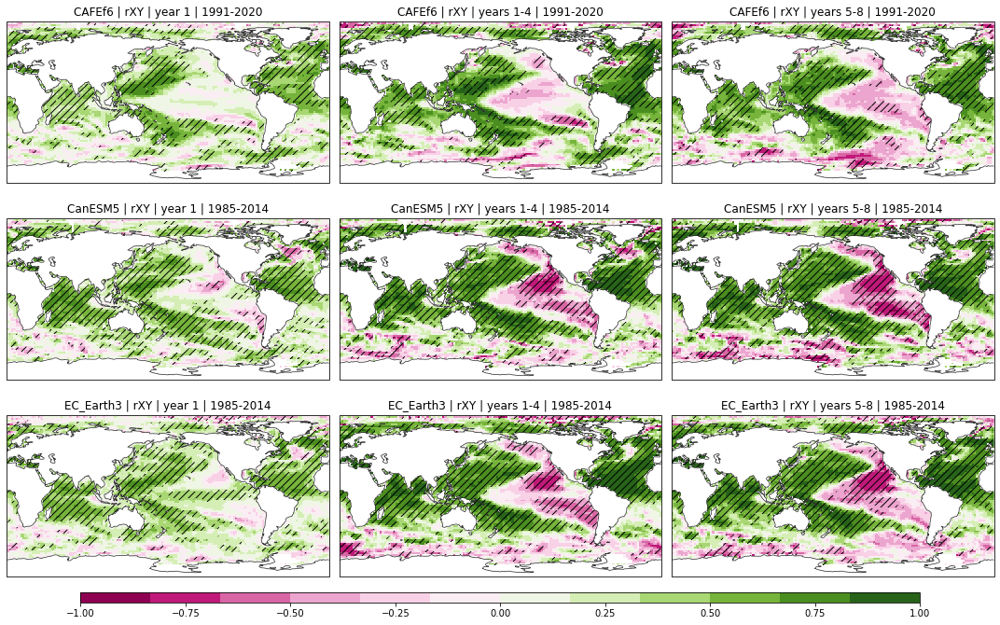

In [6]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "sst", "rXY")

#### What are those big patches of negative correlation in the Pacific the 4-year averages?
These aren't apparent in the CanESM5 verification paper. Are they an artifact of differing "trends" over the short verifcation period? Let's look at the skill of CanESM5 and EC_Earth3 over a longer (1971-2017) period of time

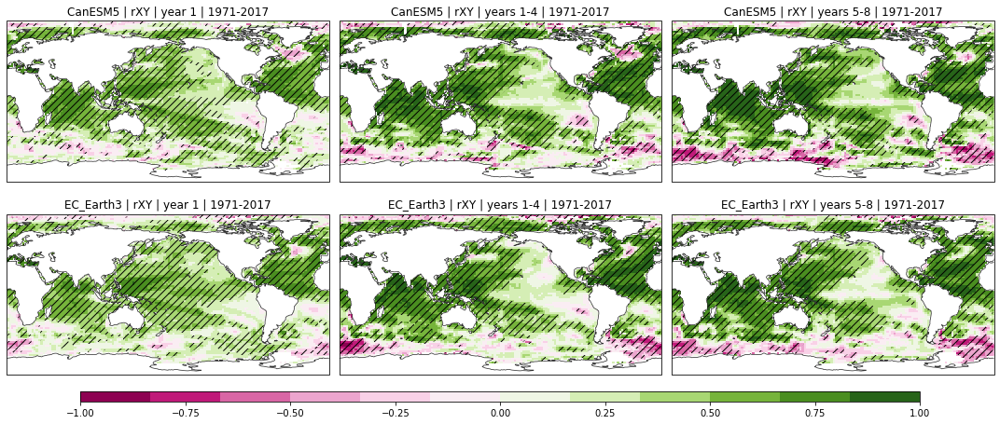

In [7]:
_ = plot_metric_maps(
    ["CanESM5", "EC_Earth3"], "HadISST", "sst", "rXY", verif_period="1971-2017"
)

This looks more like the results in the CanESM5 verification paper. So we need to be pretty careful interpretting the anomaly correlation coefficient over our short verification period. Let's demonstrate this by looking at the hindcast and observed timeseried at a location in the Pacific:

In [8]:
location = dict(lon=225, lat=10)
full_period = slice("1971", "2017")
verif_period = slice("1985", "2014")

hcst = xr.open_zarr(
    "../data/processed/CanESM5.4-year.anom_1985-2014.sst_global.zarr"
).sel(location, method="nearest")
hcst = (
    hcst["sst"]
    .mean("member")
    .sel(lead=59)
    .swap_dims({"init": "time"})
    .sel(time=full_period)
)

obsv = xr.open_zarr(
    "../data/processed/HadISST.4-year.anom_1985-2014.sst_global.zarr"
).sel(location, method="nearest")
obsv = obsv["sst"].sel(time=hcst.time)

acc_full_period = xs.pearson_r(hcst, obsv, dim="time").values.item()

acc_verif_period = xs.pearson_r(
    hcst.sel(time=verif_period), obsv.sel(time=verif_period), dim="time"
).values.item()

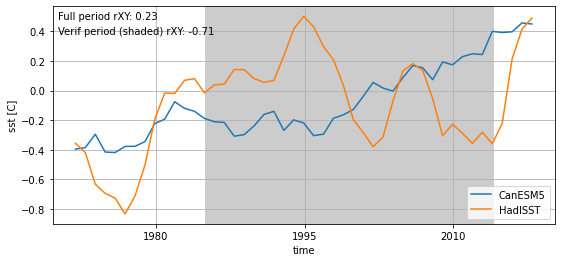

In [9]:
fig, ax = plt.subplots(figsize=(9, 4))

hcst.plot(label="CanESM5")
obsv.plot(label="HadISST")
ylim = plt.gca().get_ylim()
plt.fill_between(
    [cftime.datetime(1985, 1, 1), cftime.datetime(2014, 1, 1)],
    [ylim[0], ylim[0]],
    [ylim[1], ylim[1]],
    color=[0.8, 0.8, 0.8],
)
plt.gca().set_ylim(ylim)
plt.title("")
plt.legend(loc="lower right")
plt.grid()

plt.text(
    0.01,
    0.98,
    f"Full period rXY: {acc_full_period:.2f}",
    horizontalalignment="left",
    verticalalignment="top",
    transform=ax.transAxes,
)
_ = plt.text(
    0.01,
    0.91,
    f"Verif period (shaded) rXY: {acc_verif_period:.2f}",
    horizontalalignment="left",
    verticalalignment="top",
    transform=ax.transAxes,
)

### Initialised component of the anomaly correlation coefficient
(see https://doi.org/10.1029/2019GL086361)

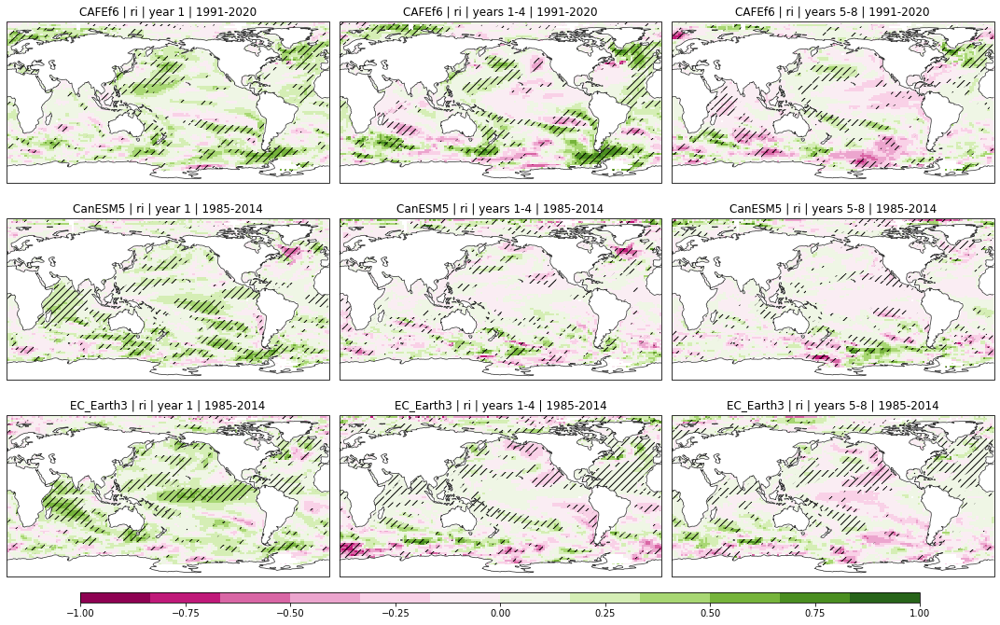

In [10]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "sst", "ri")

### Mean squared skill score relative to climatology

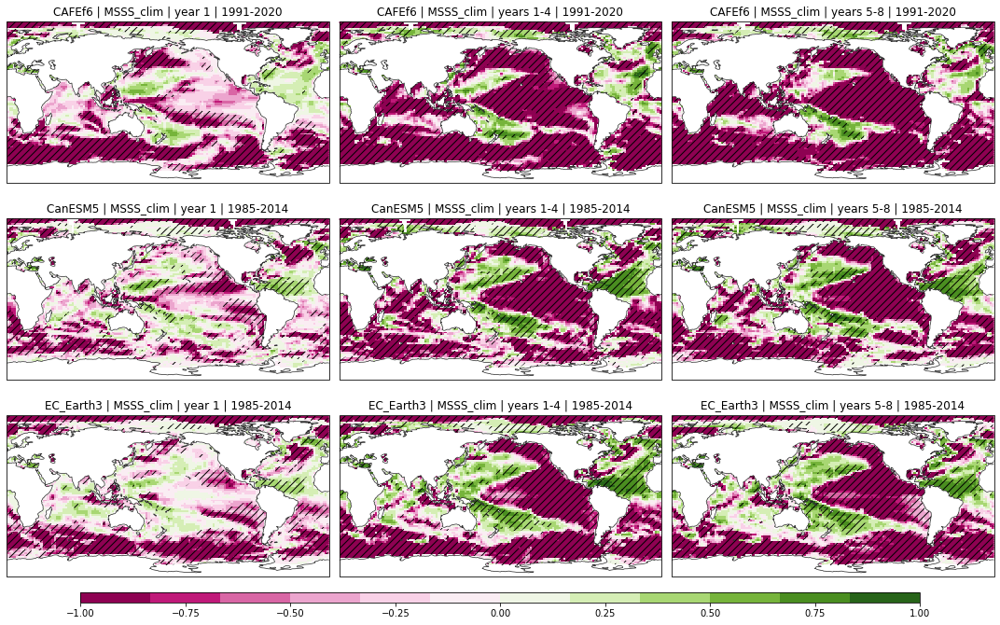

In [11]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "sst", "MSSS_clim")

### Mean squared skill score relative to historical simulations

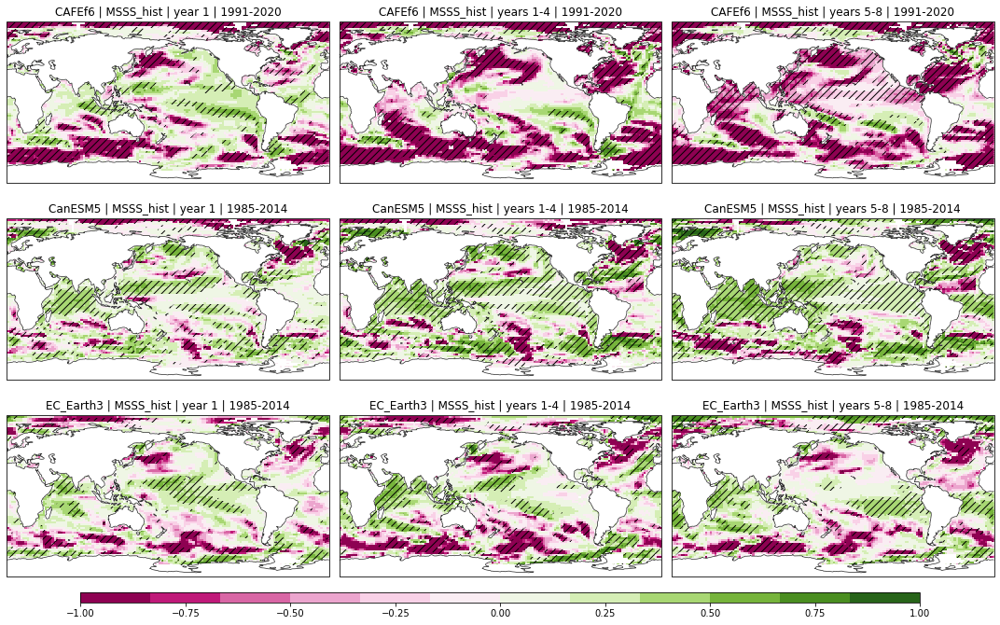

In [12]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "sst", "MSSS_hist")

### Where is the MSSS positive relative to both climatology and historical simulations?
Lighter green indicates both are positive; darker green indicates both are positive and significant

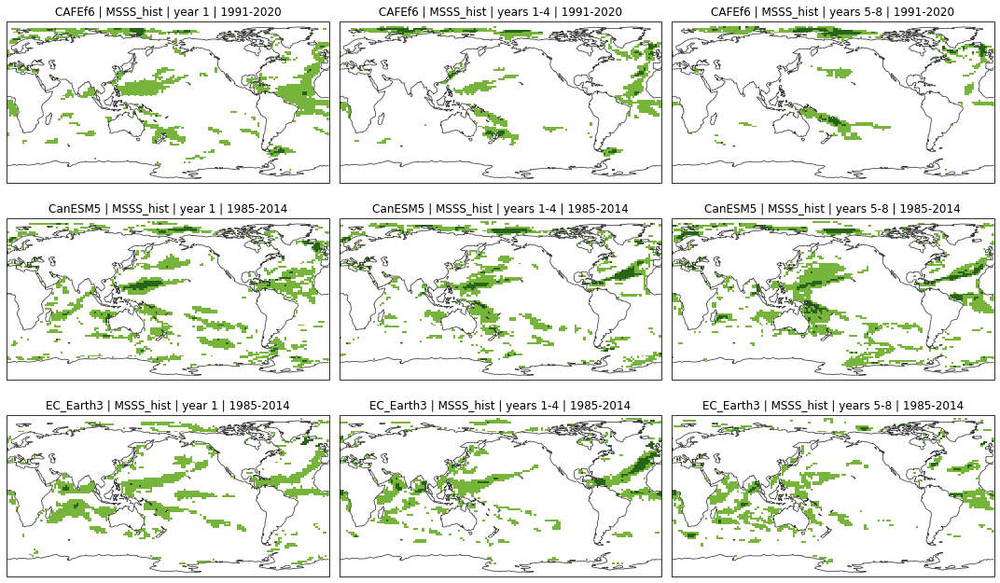

In [13]:
_ = plot_metric_maps(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "sst", ["MSSS_clim", "MSSS_hist"]
)

### Rank probability skill score relative to historical simulations

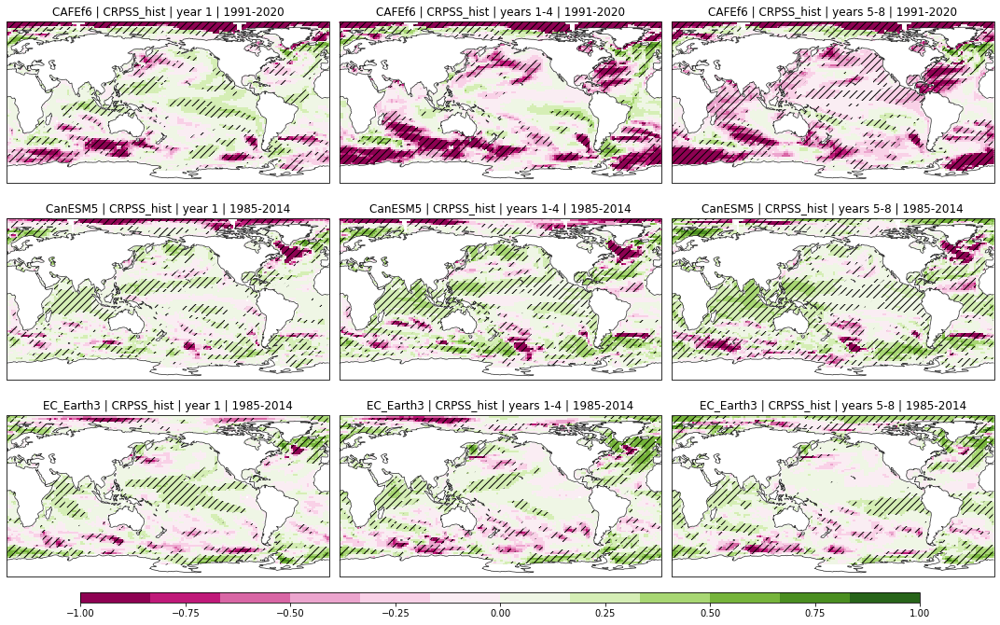

In [14]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "sst", "CRPSS_hist")

## Near-surface (2m) temperature relative to JRA55
### Anomaly correlation coefficient

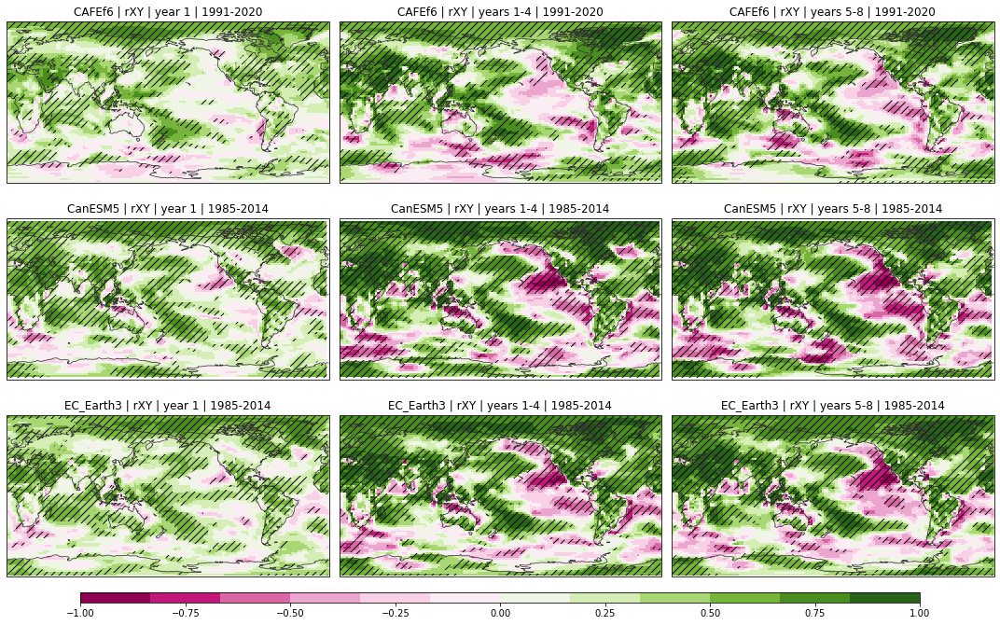

In [15]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "JRA55", "t_ref", "rXY")

### Initialised component of the anomaly correlation coefficient
(see https://doi.org/10.1029/2019GL086361)

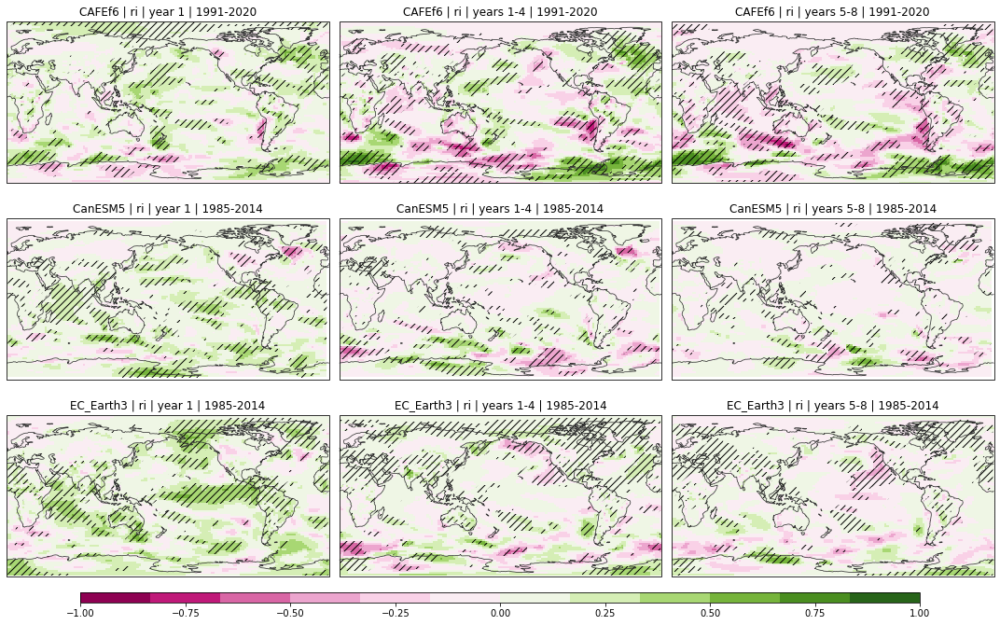

In [16]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "JRA55", "t_ref", "ri")

### Mean squared skill score relative to climatology

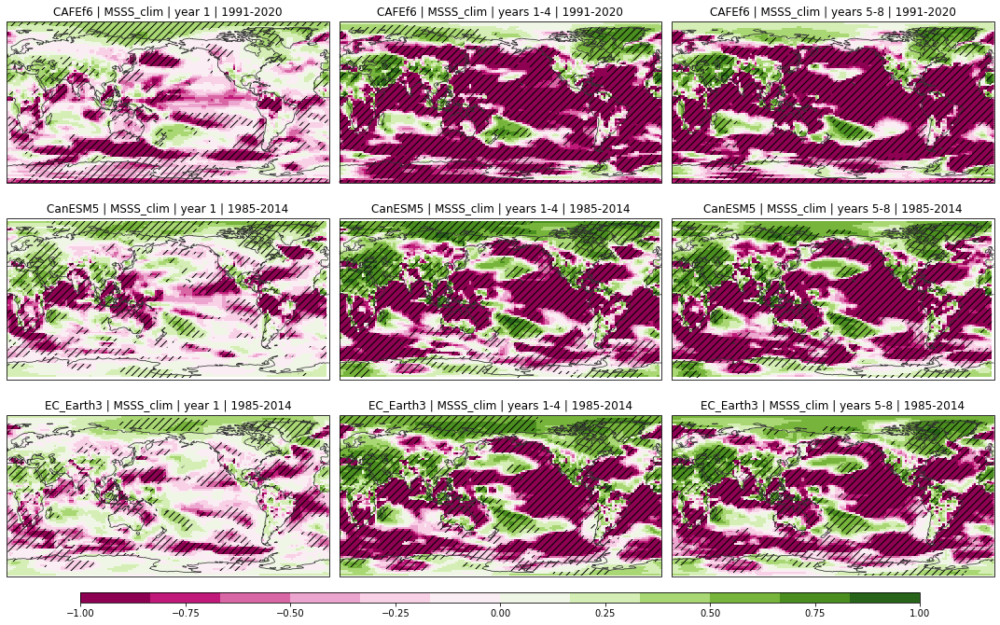

In [17]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "JRA55", "t_ref", "MSSS_clim")

### Mean squared skill score relative to historical simulations

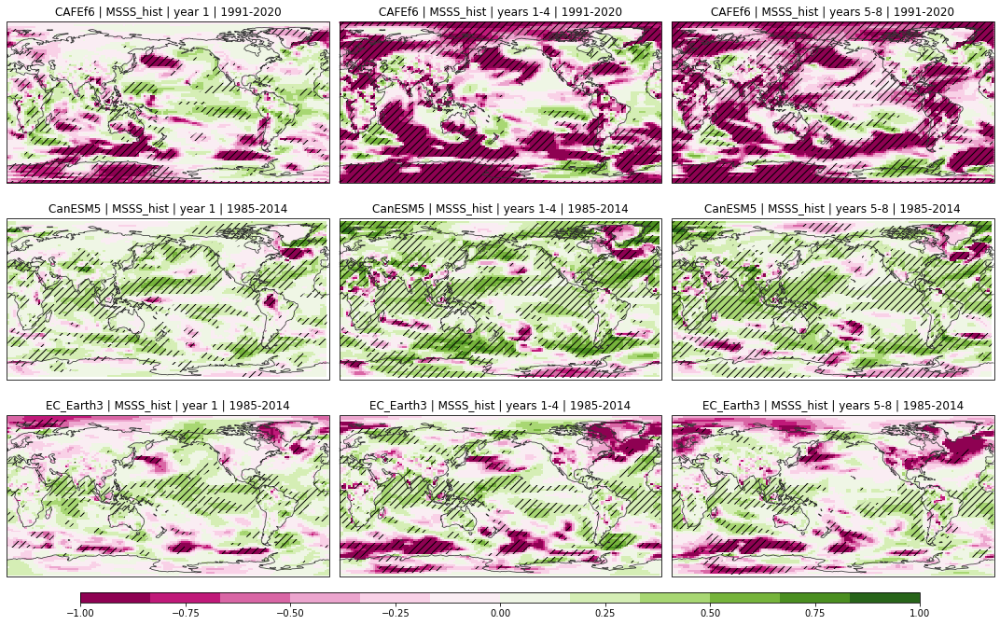

In [18]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "JRA55", "t_ref", "MSSS_hist")

### Where is the MSSS positive relative to both climatology and historical simulations?
Lighter green indicates both are positive; darker green indicates both are positive and significant

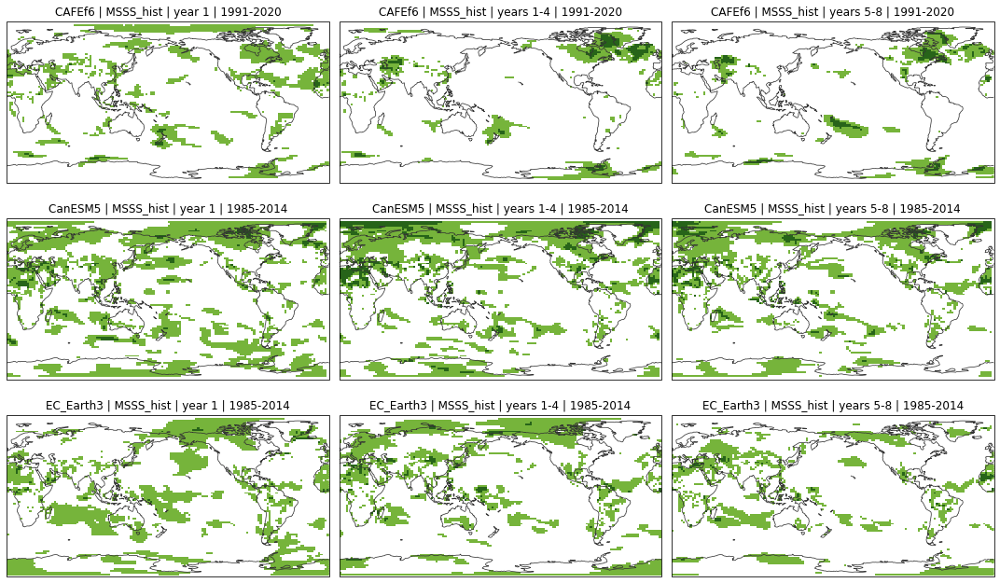

In [19]:
_ = plot_metric_maps(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "JRA55", "t_ref", ["MSSS_clim", "MSSS_hist"]
)

### Rank probability skill score relative to historical simulations

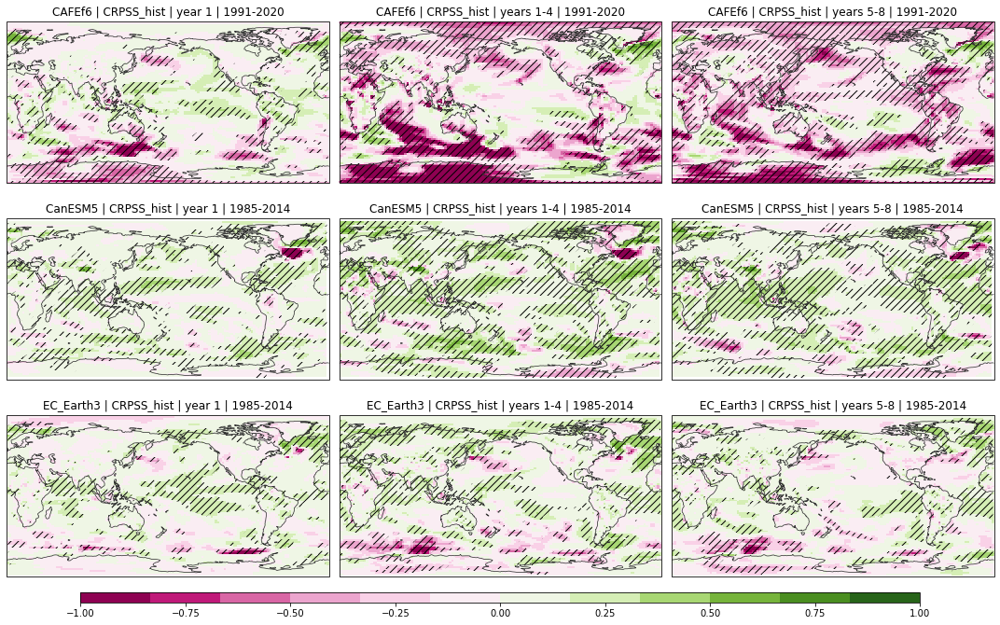

In [20]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "JRA55", "t_ref", "CRPSS_hist")

## Precipitation relative to GPCP
### Anomaly correlation coefficient

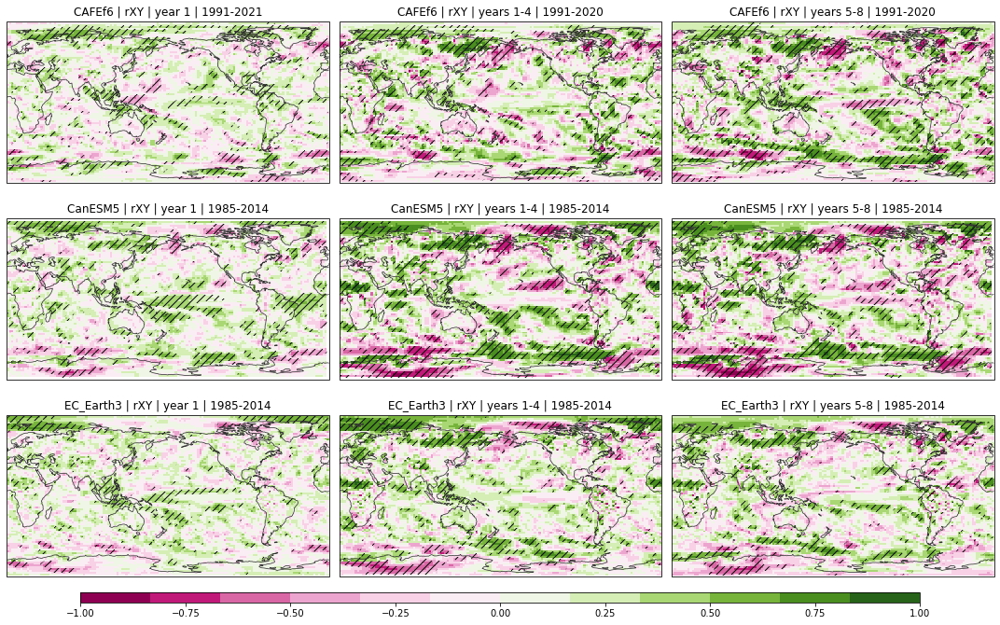

In [21]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "GPCP", "precip", "rXY")

### Initialised component of the anomaly correlation coefficient
(see https://doi.org/10.1029/2019GL086361)

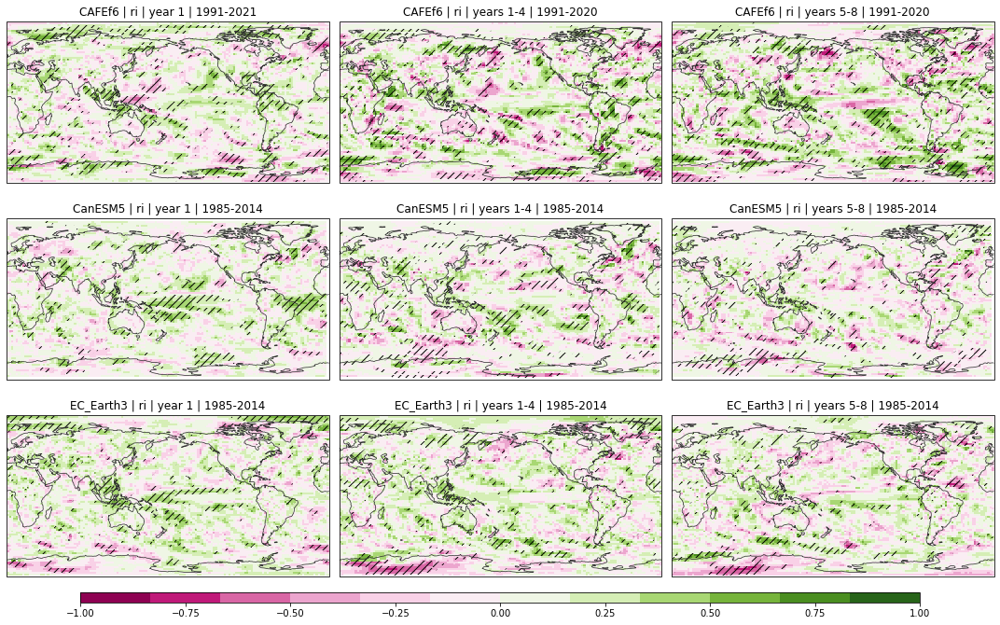

In [22]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "GPCP", "precip", "ri")

### Mean squared skill score relative to climatology

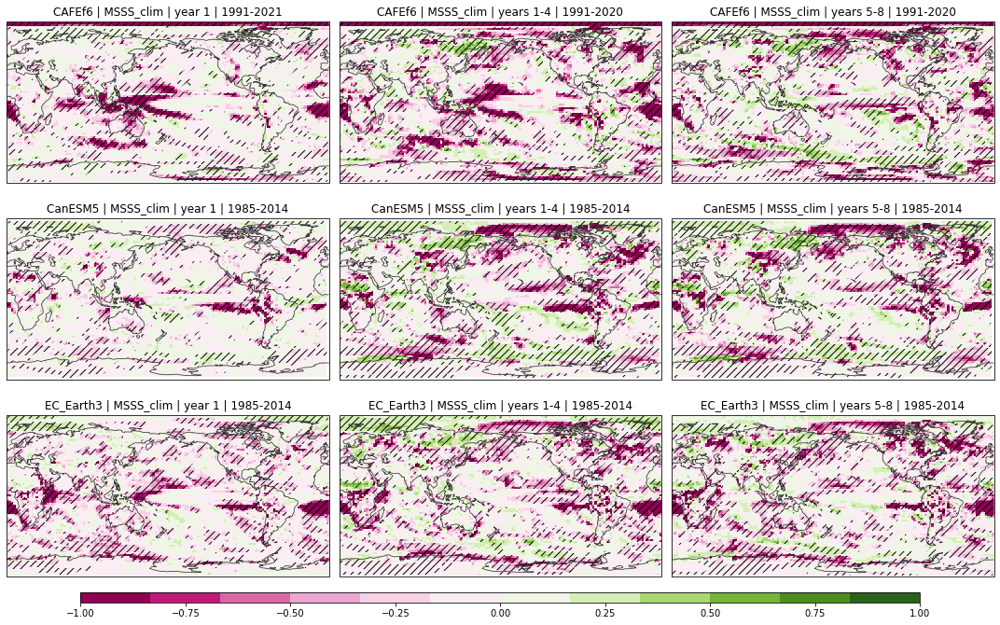

In [23]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "GPCP", "precip", "MSSS_clim")

### Mean squared skill score relative to historical simulations

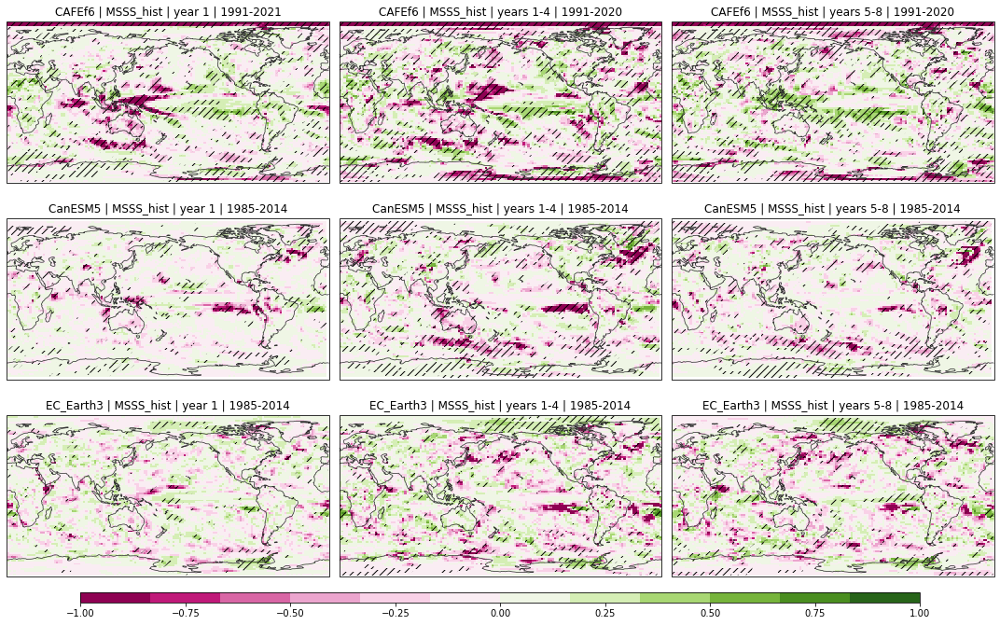

In [24]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "GPCP", "precip", "MSSS_hist")

### Where is the MSSS positive relative to both climatology and historical simulations?
Lighter green indicates both are positive; darker green indicates both are positive and significant

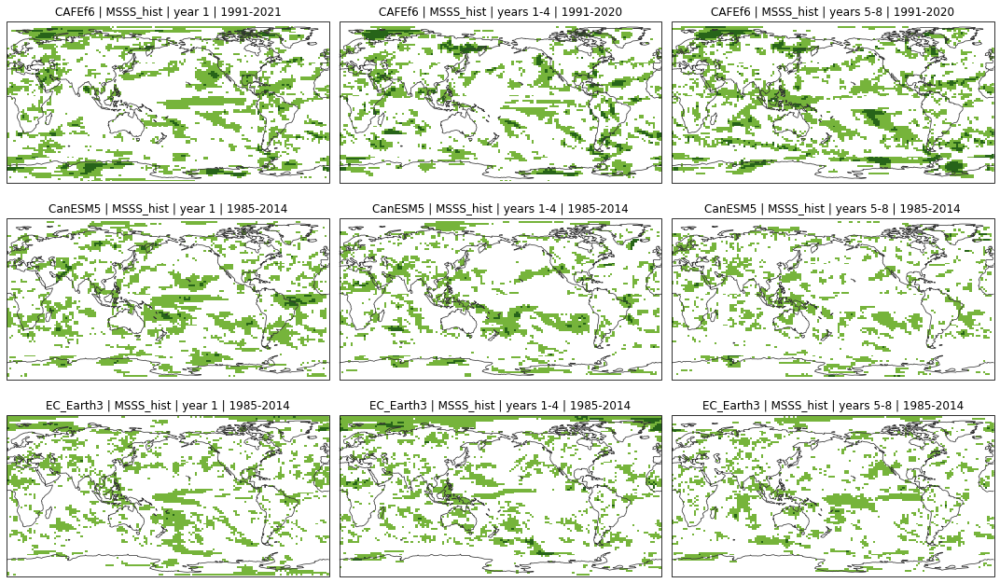

In [25]:
_ = plot_metric_maps(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "GPCP", "precip", ["MSSS_clim", "MSSS_hist"]
)

### Rank probability skill score relative to historical simulations

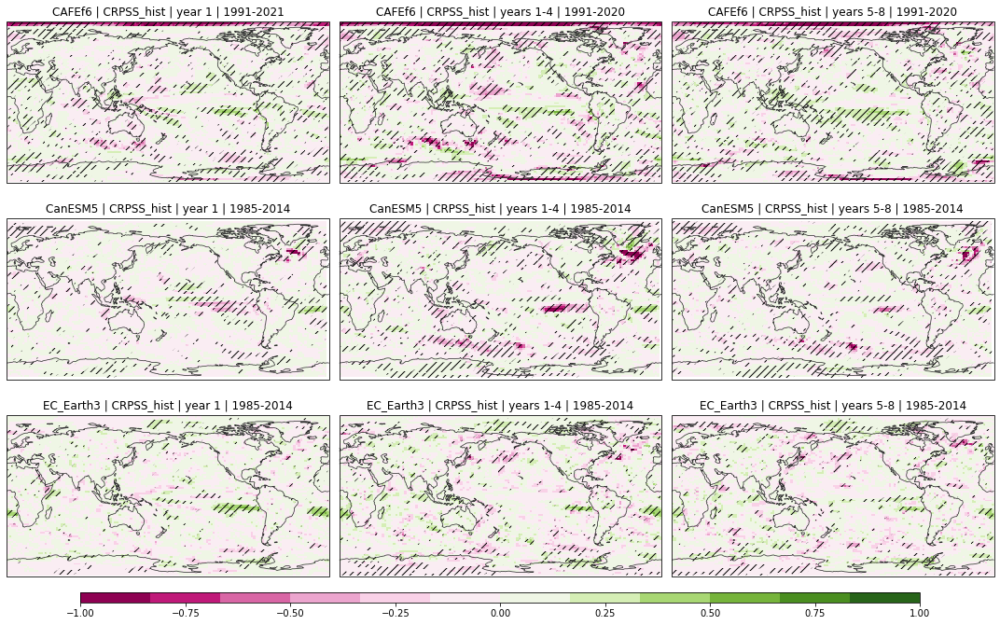

In [26]:
_ = plot_metric_maps(["CAFEf6", "CanESM5", "EC_Earth3"], "GPCP", "precip", "CRPSS_hist")

## Sea level pressure relative to JRA55
### Anomaly correlation coefficient

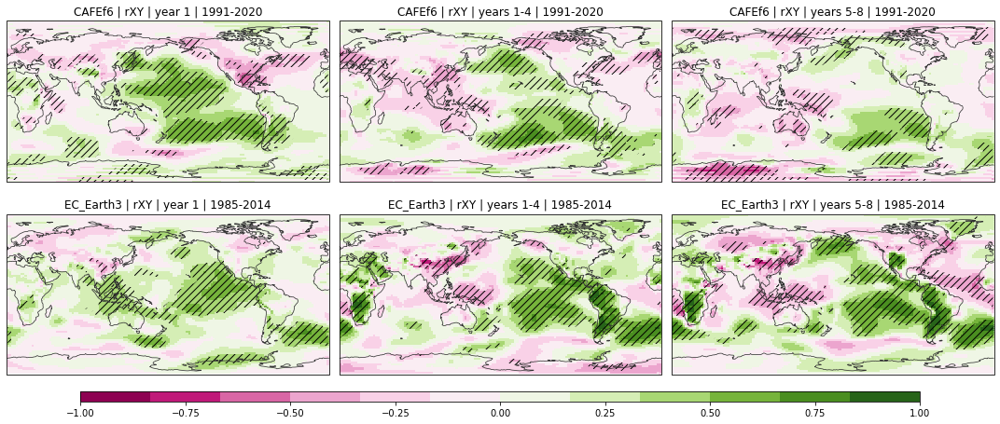

In [6]:
_ = plot_metric_maps(["CAFEf6", "EC_Earth3"], "JRA55", "slp", "rXY")

### Initialised component of the anomaly correlation coefficient
(see https://doi.org/10.1029/2019GL086361)

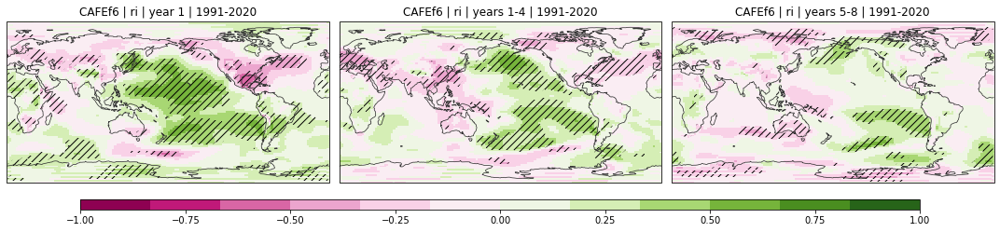

In [7]:
_ = plot_metric_maps(["CAFEf6"], "JRA55", "slp", "ri")

### Mean squared skill score relative to climatology

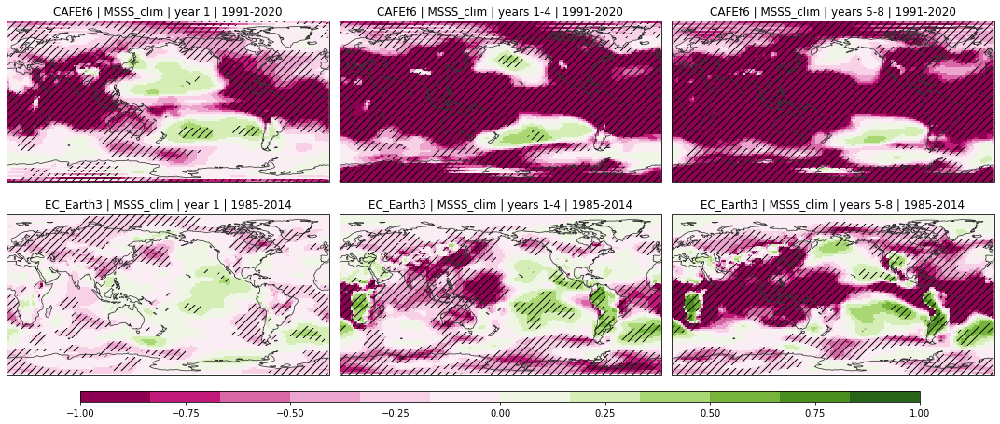

In [8]:
_ = plot_metric_maps(["CAFEf6", "EC_Earth3"], "JRA55", "slp", "MSSS_clim")

### Mean squared skill score relative to historical simulations

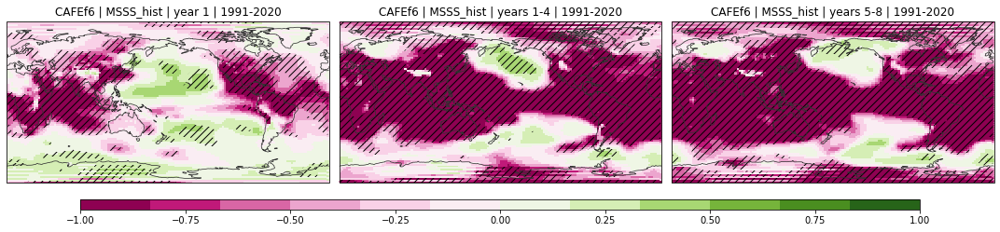

In [9]:
_ = plot_metric_maps(["CAFEf6"], "JRA55", "slp", "MSSS_hist")

### Where is the MSSS positive relative to both climatology and historical simulations?
Lighter green indicates both are positive; darker green indicates both are positive and significant

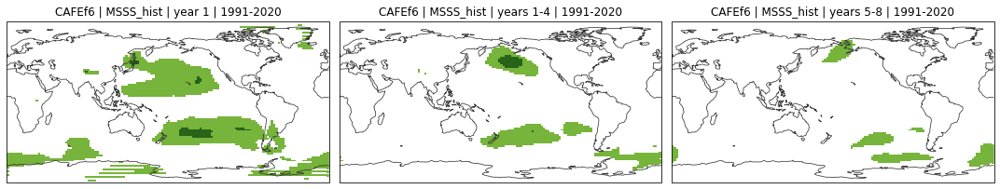

In [26]:
_ = plot_metric_maps(["CAFEf6"], "JRA55", "slp", ["MSSS_clim", "MSSS_hist"])

### Rank probability skill score relative to historical simulations

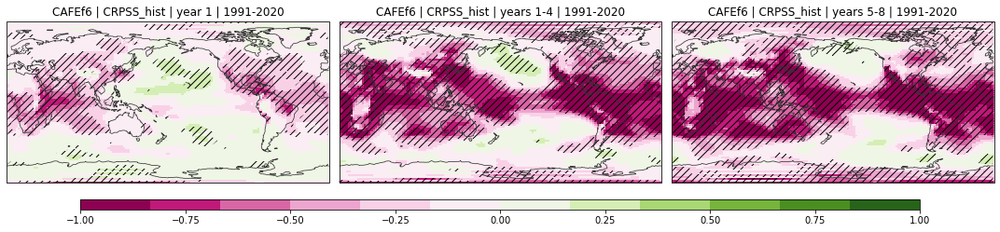

In [11]:
_ = plot_metric_maps(["CAFEf6"], "JRA55", "slp", "CRPSS_hist")

## Upper ocean heat content (upper 300m) relative to EN.4.2.2
### Anomaly correlation coefficient

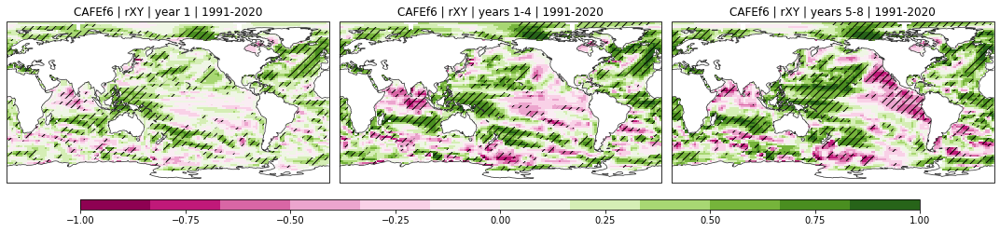

In [27]:
_ = plot_metric_maps(["CAFEf6"], "EN422", "ohc300", "rXY")

### Initialised component of the anomaly correlation coefficient
(see https://doi.org/10.1029/2019GL086361)

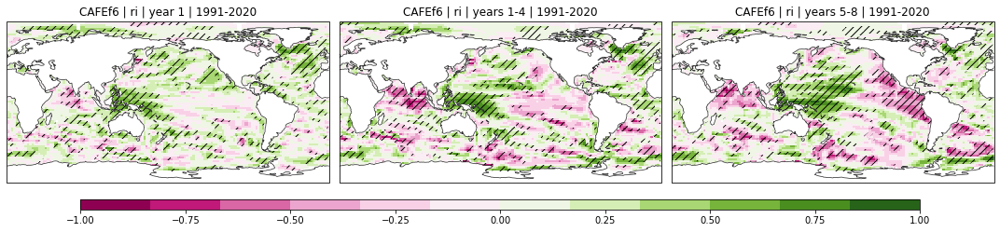

In [28]:
_ = plot_metric_maps(["CAFEf6"], "EN422", "ohc300", "ri")

### Mean squared skill score relative to climatology

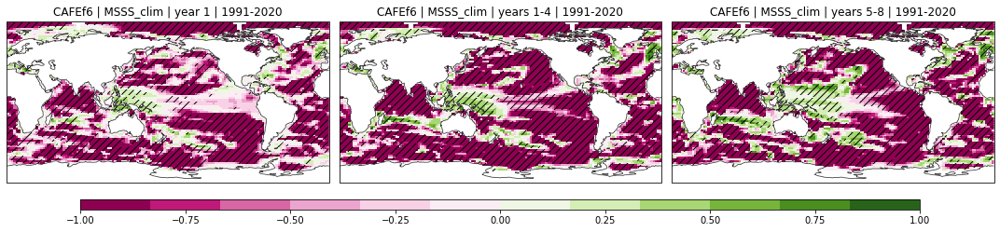

In [29]:
_ = plot_metric_maps(["CAFEf6"], "EN422", "ohc300", "MSSS_clim")

### Mean squared skill score relative to historical simulations

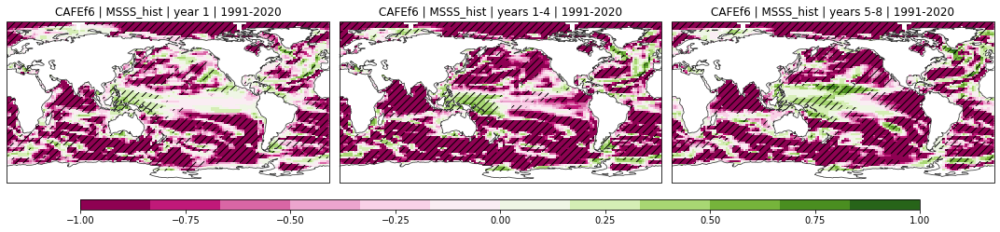

In [30]:
_ = plot_metric_maps(["CAFEf6"], "EN422", "ohc300", "MSSS_hist")

### Where is the MSSS positive relative to both climatology and historical simulations?
Lighter green indicates both are positive; darker green indicates both are positive and significant

In [ ]:
1

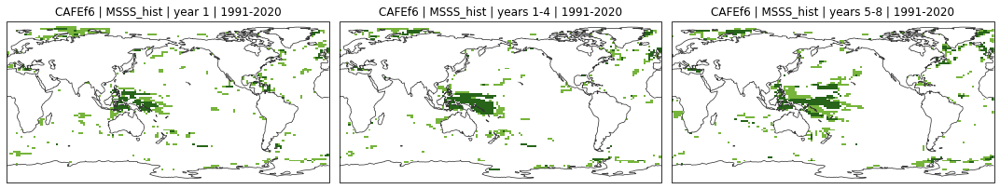

In [31]:
_ = plot_metric_maps(["CAFEf6"], "EN422", "ohc300", ["MSSS_clim", "MSSS_hist"])

### Rank probability skill score relative to historical simulations

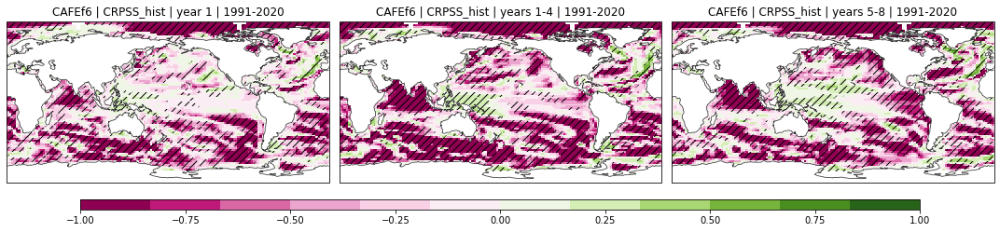

In [32]:
_ = plot_metric_maps(["CAFEf6"], "EN422", "ohc300", "CRPSS_hist")

## El-Nino Southern Oscillation (via NINO 3.4) relative to HadISST

### Anomaly correlation coefficient

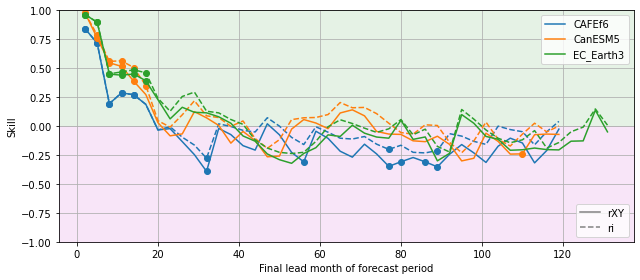

In [33]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "3-month", "nino34", ["rXY", "ri"]
)

### Mean squared skill score

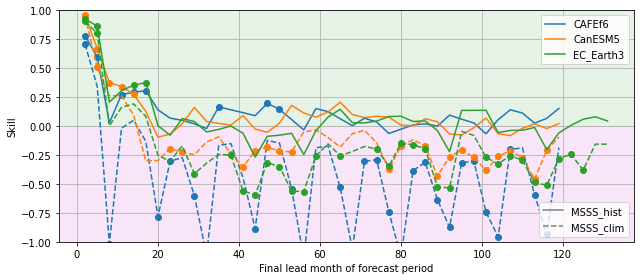

In [34]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    "HadISST",
    "3-month",
    "nino34",
    ["MSSS_hist", "MSSS_clim"],
)

### Rank probability skill score relative to historical simulations

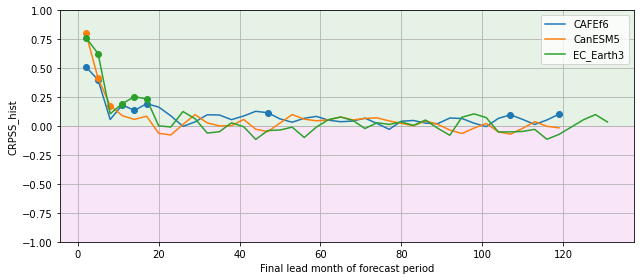

In [35]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "3-month", "nino34", ["CRPSS_hist"]
)

## Indian Ocean Dipole (via DMI) relative to HadISST

### Anomaly correlation coefficient

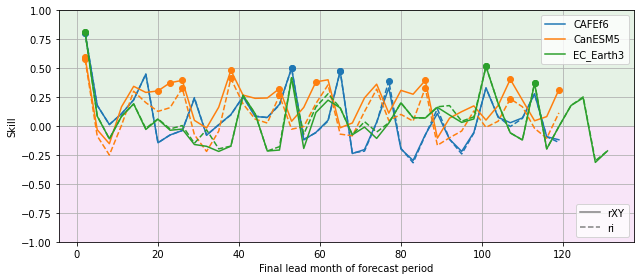

In [36]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "3-month", "dmi", ["rXY", "ri"]
)

### Mean squared skill score

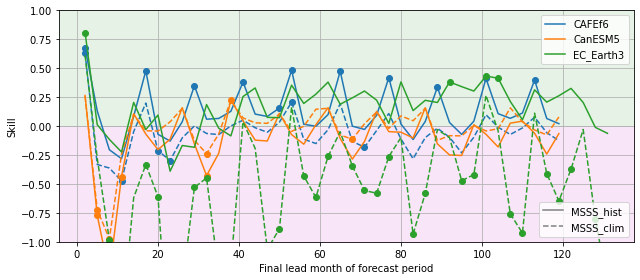

In [37]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    "HadISST",
    "3-month",
    "dmi",
    ["MSSS_hist", "MSSS_clim"],
)

### Rank probability skill score relative to historical simulations

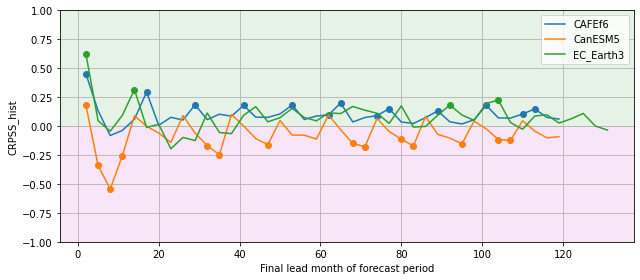

In [38]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "3-month", "dmi", ["CRPSS_hist"]
)

## Southern Annual Mode (via Gong and Wang Index) relative to JRA55

### Anomaly correlation coefficient

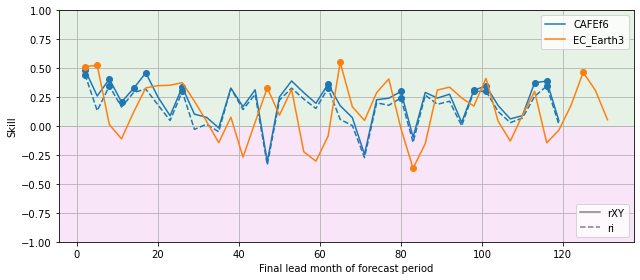

In [39]:
_ = plot_metrics(["CAFEf6", "EC_Earth3"], "JRA55", "3-month", "sam", ["rXY", "ri"])

### Mean squared skill score

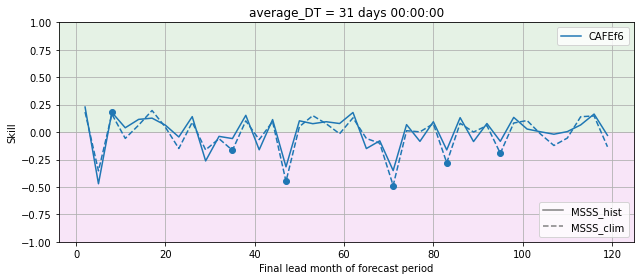

In [40]:
_ = plot_metrics(["CAFEf6"], "JRA55", "3-month", "sam", ["MSSS_hist", "MSSS_clim"])

### Rank probability skill score relative to historical simulations

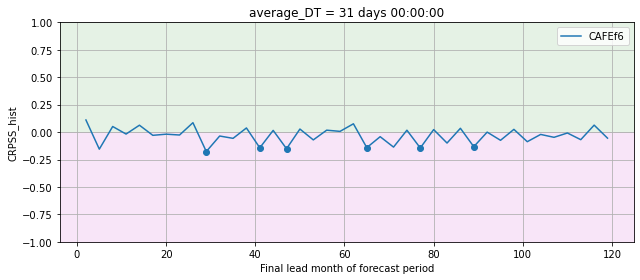

In [41]:
_ = plot_metrics(["CAFEf6"], "JRA55", "3-month", "sam", ["CRPSS_hist"])

## North Atlantic Oscillation Index (via Jianping and Wang Index) relative to JRA55

### Anomaly correlation coefficient

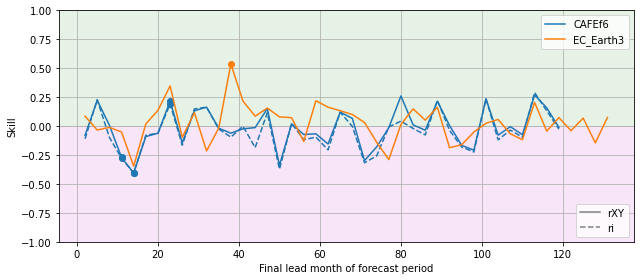

In [42]:
_ = plot_metrics(["CAFEf6", "EC_Earth3"], "JRA55", "3-month", "nao", ["rXY", "ri"])

### Mean squared skill score

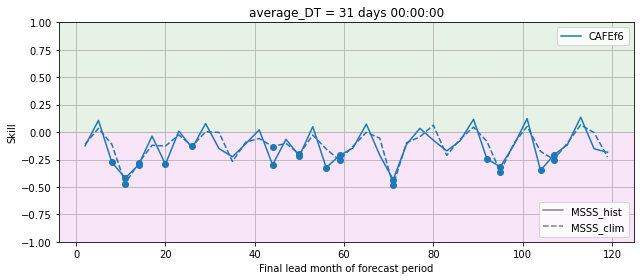

In [43]:
_ = plot_metrics(["CAFEf6"], "JRA55", "3-month", "nao", ["MSSS_hist", "MSSS_clim"])

### Rank probability skill score relative to historical simulations

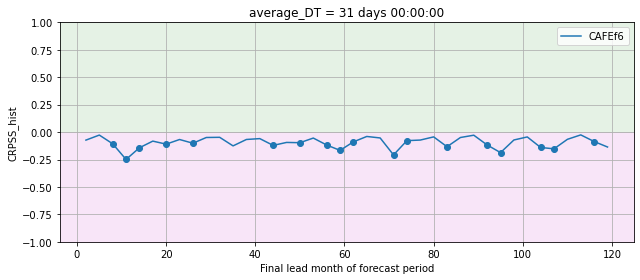

In [44]:
_ = plot_metrics(["CAFEf6"], "JRA55", "3-month", "nao", ["CRPSS_hist"])

## Atlantic multi-decadal variability relative to HadISST
(see https://doi.org/10.1029/2006GL026894)

### Anomaly correlation coefficient

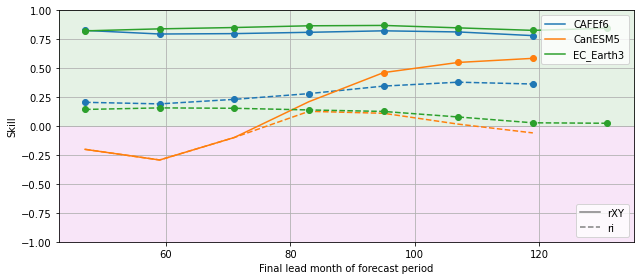

In [45]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "4-year", "amv", ["rXY", "ri"]
)

### Mean squared skill score

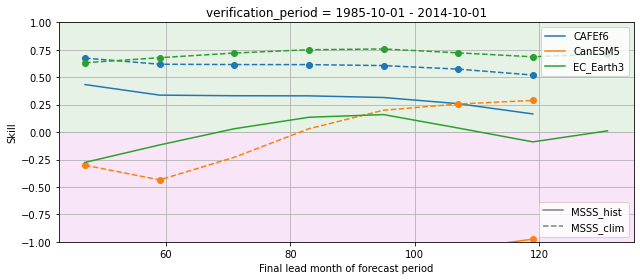

In [46]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    "HadISST",
    "4-year",
    "amv",
    ["MSSS_hist", "MSSS_clim"],
)

### Rank probability skill score relative to historical simulations

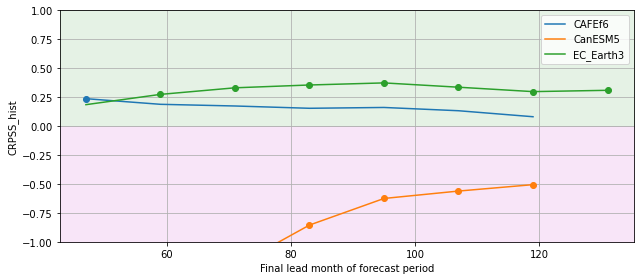

In [47]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "4-year", "amv", ["CRPSS_hist"]
)

## Inter-decadal Pacific oscillation relative to HadISST
(see https://doi.org/10.1007/s00382-015-2525-1)

### Anomaly correlation coefficient

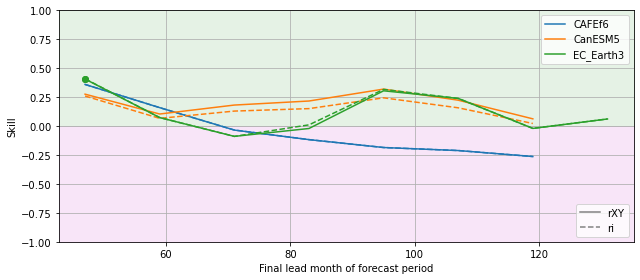

In [48]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "4-year", "ipo", ["rXY", "ri"]
)

### Mean squared skill score

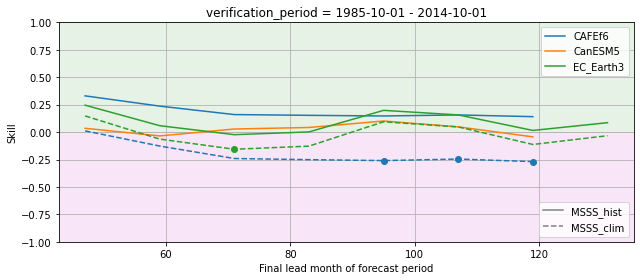

In [49]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"],
    "HadISST",
    "4-year",
    "ipo",
    ["MSSS_hist", "MSSS_clim"],
)

### Rank probability skill score relative to historical simulations

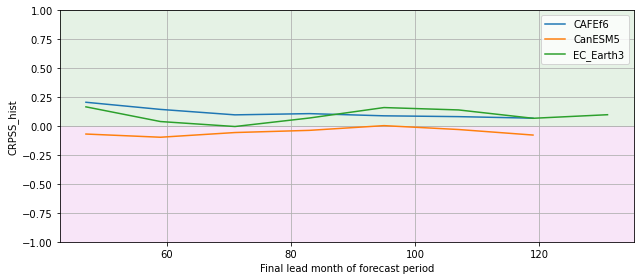

In [50]:
_ = plot_metrics(
    ["CAFEf6", "CanESM5", "EC_Earth3"], "HadISST", "4-year", "ipo", ["CRPSS_hist"]
)